# Setting things up

In [1]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!unzip archive.zip

Archive:  archive.zip
replace dataset/extra/hina/audio_1.wav? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
  inflating: dataset/train/hina/hina.mp3  
  inflating: dataset/train/hina/hina2.mp3  
  inflating: dataset/train/hina/hina3.mp3  
  inflating: dataset/train/hina/hina4.mp3  
  inflating: dataset/train/hina/hina5.mp3  
  inflating: dataset/train/hina/hina6.mp3  
  inflating: dataset/train/syedali/syedali.mp3  
  inflating: dataset/train/syedali/syedali2.mp3  
  inflating: dataset/train/syedali/syedali3.mp3  
  inflating: dataset/train/syedali/syedali4.mp3  
  inflating: dataset/train/syedali/syedali5.mp3  
  inflating: dataset/train/syedali/syedali6.mp3  
  inflating: dataset/train/syedali/syedali7.mp3  
  inflating: dataset/train/syedali/syedali8.mp3  
  inflating: dataset/train/syedali/syedali9.mp3  
  inflating: dataset/valid/hina/hina7.mp3  
  inflating: dataset/valid/hina/hina8.mp3  
  inflating: dataset/valid/syedali/syedali10.mp3  
  inflating: dataset/valid/syedali/syedali11.mp

In [3]:
!git clone https://github.com/resemble-ai/Resemblyzer.git
!cd Resemblyzer

Cloning into 'Resemblyzer'...
remote: Enumerating objects: 611, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 611 (delta 2), reused 8 (delta 2), pack-reused 602
Receiving objects: 100% (611/611), 101.47 MiB | 29.35 MiB/s, done.
Resolving deltas: 100% (109/109), done.


In [4]:
!pip install resemblyzer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 77.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for webrtcvad: filename=webrtcvad-2.0.10-cp310-cp310-linux_x86_64.whl size=81207 sha256=326c3947de0b3dbc0b2a42dcc5207ac5b753f53d8c2d92d0313c82154afb20fe
  Stored in directory: /root/.cache/pip/wheels/2a/2b/84/ac7bacfe8c68a87c1ee3dd3c66818a54c71599abf308e8eb35
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26305 sha256=773d5facde483d39d378458a8767f58398c717558c69fc61b18b9a64e6645fe8
  Stored in directory: /root/.cache/pip/wheels/7c/d0/9e/1f26ebb66d9e1732e4098bc5a6c2d91f6c9a529838f0284890
Successfully built webrtcvad typing


In [5]:
!pip3 install spectralcluster

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import os
from pydub import AudioSegment
import numpy as np
import pandas as pd
import glob
import librosa
from IPython.display import Audio
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from resemblyzer import preprocess_wav, VoiceEncoder
from pathlib import Path
from pydub import AudioSegment
from resemblyzer import sampling_rate
from spectralcluster import SpectralClusterer, RefinementOptions

# Using Classification

##Preprocessing

In [7]:
def convert_files_in_folder(parent_dir, sub_dirs):
    for sub_dir in sub_dirs:
        path = os.path.join(parent_dir, sub_dir)
        for root, dirs, files in os.walk(path):
            for filename in files:
                if filename.endswith('.mp3'):
                    mp3_sound = AudioSegment.from_mp3(os.path.join(root, filename))
                    # change the extension to .wav
                    filename_wav = filename[:-4] + '.wav'
                    mp3_sound.export(os.path.join(root, filename_wav), format="wav")
                    print(f'Converted {filename} to wav format in {root} directory.')
                    # remove original .mp3 file
                    os.remove(os.path.join(root, filename))
                    print(f'Removed {filename}.')

# specify the parent directory and sub directories
parent_dir = 'dataset'
sub_dirs = ['train', 'valid']

convert_files_in_folder(parent_dir, sub_dirs)

Converted hina.mp3 to wav format in dataset/train/hina directory.
Removed hina.mp3.
Converted hina5.mp3 to wav format in dataset/train/hina directory.
Removed hina5.mp3.
Converted hina2.mp3 to wav format in dataset/train/hina directory.
Removed hina2.mp3.
Converted hina3.mp3 to wav format in dataset/train/hina directory.
Removed hina3.mp3.
Converted hina6.mp3 to wav format in dataset/train/hina directory.
Removed hina6.mp3.
Converted hina4.mp3 to wav format in dataset/train/hina directory.
Removed hina4.mp3.
Converted syedali3.mp3 to wav format in dataset/train/syedali directory.
Removed syedali3.mp3.
Converted syedali7.mp3 to wav format in dataset/train/syedali directory.
Removed syedali7.mp3.
Converted syedali6.mp3 to wav format in dataset/train/syedali directory.
Removed syedali6.mp3.
Converted syedali9.mp3 to wav format in dataset/train/syedali directory.
Removed syedali9.mp3.
Converted syedali4.mp3 to wav format in dataset/train/syedali directory.
Removed syedali4.mp3.
Converted s

In [8]:
for dirname, _, filenames in os.walk('dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings("ignore")

dataset/valid/junaid/audio_19.wav
dataset/valid/junaid/audio_20.wav
dataset/valid/hina/hina8.wav
dataset/valid/hina/hina7.wav
dataset/valid/syedali/syedali10.wav
dataset/valid/syedali/syedali11.wav
dataset/extra/junaid/audio_15.wav
dataset/extra/junaid/audio_18.wav
dataset/extra/junaid/audio_17.wav
dataset/extra/junaid/audio_16.wav
dataset/extra/junaid/audio_14.wav
dataset/extra/junaid/audio_11.wav
dataset/extra/junaid/audio_13.wav
dataset/extra/junaid/audio_12.wav
dataset/extra/hina/audio_1.wav
dataset/extra/hina/audio_2.wav
dataset/extra/hina/audio_3.wav
dataset/train/junaid/audio_5.wav
dataset/train/junaid/audio_10.wav
dataset/train/junaid/audio_7.wav
dataset/train/junaid/audio_1.wav
dataset/train/junaid/audio_9.wav
dataset/train/junaid/audio_6.wav
dataset/train/junaid/audio_2.wav
dataset/train/junaid/audio_3.wav
dataset/train/junaid/audio_8.wav
dataset/train/junaid/audio_4.wav
dataset/train/hina/audio_5.wav
dataset/train/hina/hina.wav
dataset/train/hina/audio_7.wav
dataset/train/hi

In [9]:
def read_path_audio_and_target(is_train=True):
    paths, targets = [], []
    
    if is_train:
        name = 'train'
    else:
        name = 'valid'
        
    for cls in ['junaid', 'hina', 'syedali']:
        path = glob.glob(f'dataset/{name}/{cls}/*')
    
        if cls == 'junaid':
            target = [0 for _ in range(len(path))]
        elif cls == 'syedali':
            target = [1 for _ in range(len(path))]
        else:
            target = [2 for _ in range(len(path))]

        paths.extend(path)
        targets.extend(target)
    
    return paths, targets

In [10]:
paths_train, targets_train = read_path_audio_and_target(is_train=True)
paths_test, targets_test = read_path_audio_and_target(is_train=False)

paths_train

['dataset/train/junaid/audio_5.wav',
 'dataset/train/junaid/audio_10.wav',
 'dataset/train/junaid/audio_7.wav',
 'dataset/train/junaid/audio_1.wav',
 'dataset/train/junaid/audio_9.wav',
 'dataset/train/junaid/audio_6.wav',
 'dataset/train/junaid/audio_2.wav',
 'dataset/train/junaid/audio_3.wav',
 'dataset/train/junaid/audio_8.wav',
 'dataset/train/junaid/audio_4.wav',
 'dataset/train/hina/audio_5.wav',
 'dataset/train/hina/hina.wav',
 'dataset/train/hina/audio_7.wav',
 'dataset/train/hina/hina6.wav',
 'dataset/train/hina/hina5.wav',
 'dataset/train/hina/hina4.wav',
 'dataset/train/hina/audio_6.wav',
 'dataset/train/hina/hina2.wav',
 'dataset/train/hina/audio_4.wav',
 'dataset/train/hina/hina3.wav',
 'dataset/train/syedali/syedali.wav',
 'dataset/train/syedali/syedali6.wav',
 'dataset/train/syedali/syedali9.wav',
 'dataset/train/syedali/syedali3.wav',
 'dataset/train/syedali/syedali8.wav',
 'dataset/train/syedali/syedali4.wav',
 'dataset/train/syedali/syedali2.wav',
 'dataset/train/syed

In [11]:
print(paths_train[0])
sample_junaid, sr = librosa.load(paths_train[0])
display(Audio(sample_junaid, rate=sr))

dataset/train/junaid/audio_5.wav


In [12]:
print(paths_train[11])
sample_hira, sr = librosa.load(paths_train[11])
display(Audio(sample_hira, rate=sr))

dataset/train/hina/hina.wav


In [13]:
print(paths_train[-1])
sample_hira, sr = librosa.load(paths_train[-1])
display(Audio(sample_hira, rate=sr))

dataset/train/syedali/syedali7.wav


In [14]:
def reshape_sound_and_target(path_sound, targets, segment_size_t=1):
    segments_sound, segments_target = [], []
    
    for i in range(len(path_sound)):
        # load
        y, sr = librosa.load(path_sound[i])

        signal_len = len(y) 
        # segment size in samples
        segment_size = int(segment_size_t * sr)  
        # Break signal into list of segments
        segments = [y[x:x + segment_size] for x in np.arange(0, signal_len, segment_size)]

        target = [targets[i] for _ in range(len(segments))]

        segments_sound.extend(segments)
        segments_target.extend(target)

    segments_sound = np.array(segments_sound)
    segments_target = np.array(segments_target)
    
    return segments_sound, segments_target, sr

In [15]:
segment_size_t = 0.5

segments_sound_train, segments_target_train, sr = reshape_sound_and_target(paths_train, targets_train, segment_size_t)
segments_sound_test, segments_target_test, _ = reshape_sound_and_target(paths_test, targets_test, segment_size_t)

In [16]:
segments_sound_train.shape, segments_target_train.shape, sr

((1187,), (1187,), 22050)

## Feature creation, scaling and plotting


In [17]:
def create_feature(segments, sr):
    features = [
            ('chroma_stft', librosa.feature.chroma_stft),
            ('rms', librosa.feature.rms),
            ('spectral_centroid', librosa.feature.spectral_centroid),
            ('spectral_bandwidth', librosa.feature.spectral_bandwidth),
            ('spectral_rolloff', librosa.feature.spectral_rolloff),
            ('zero_crossing_rate', librosa.feature.zero_crossing_rate),
            ('mfcc', librosa.feature.mfcc)
    ]

    features_segmentation = []

    for seg in segments:
        feature_segmentation = []
        try:
            for name, func in features:

                if name in ['rms', 'zero_crossing_rate']:
                    y0 = func(y=seg)
                    feature_segmentation.append(np.mean(y0))

                elif name == 'mfcc':
                    y0 = func(y=seg, sr=sr)
                    for i, m in enumerate(y0, 1):
                        feature_segmentation.append(np.mean(m))

                else:
                    y0 = func(y=seg, sr=sr)
                    feature_segmentation.append(np.mean(y0)) 

        except Exception as e:
            print(e)        

        features_segmentation.append(feature_segmentation)

    features_segmentation = np.array(features_segmentation)
    return features_segmentation

In [18]:
feature_train = create_feature(segments_sound_train, sr)
feature_test = create_feature(segments_sound_test, sr)

feature_train.shape, feature_test.shape

((1187, 26), (190, 26))

In [19]:
scaler = StandardScaler()
scaler.fit(feature_train)

StandardScaler()

In [20]:
feature_train_scaler = scaler.transform(feature_train)
feature_test_scaler = scaler.transform(feature_test)

feature_train_scaler.shape, feature_test_scaler.shape

((1187, 26), (190, 26))

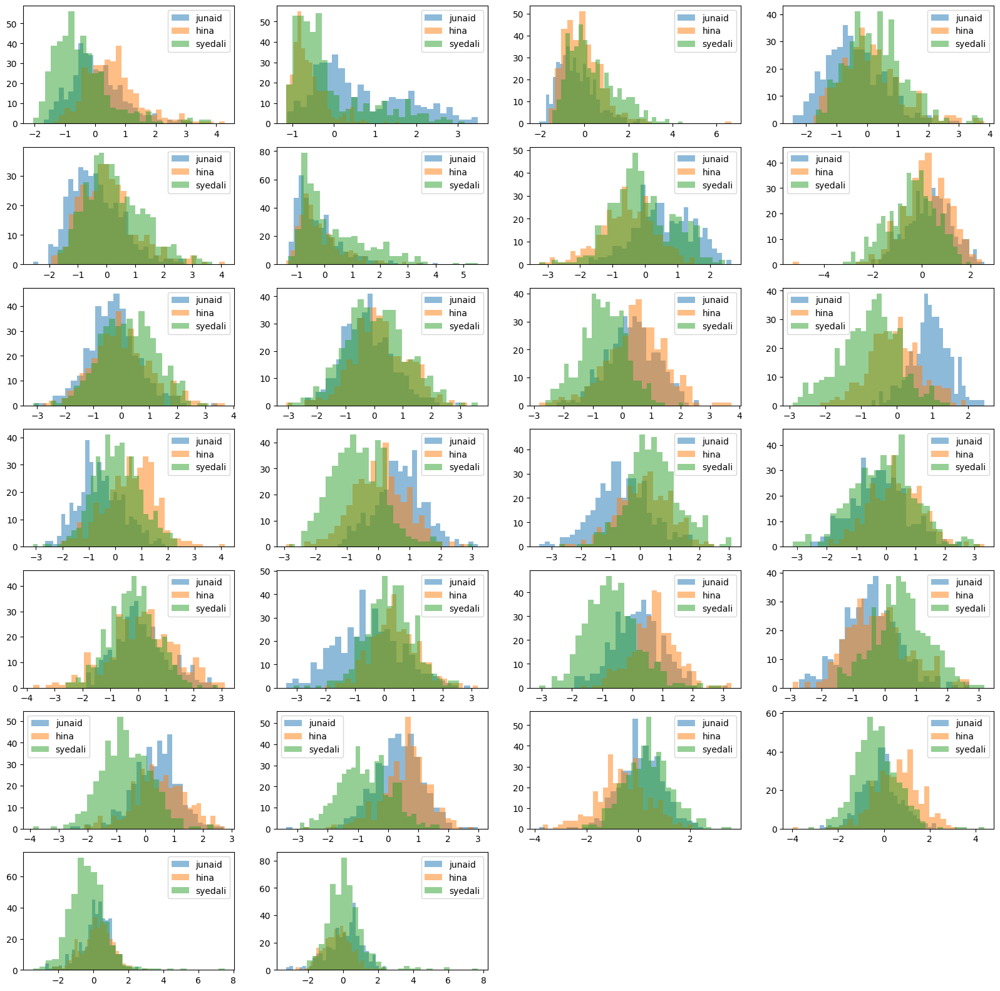

In [21]:
plt.figure(figsize=(20,20))
for i in range(0, feature_train_scaler.shape[1]):
    plt.subplot(7,4,i+1)
    plt.hist(feature_train_scaler[:,i][segments_target_train == 0], bins=30, alpha=0.5)
    plt.hist(feature_train_scaler[:,i][segments_target_train == 1], bins=30, alpha=0.5)
    plt.hist(feature_train_scaler[:,i][segments_target_train == 2], bins=30, alpha=0.5)
    plt.legend(['junaid', 'hina', 'syedali'])
plt.show()

## Training models

In [22]:
model_rfc = RandomForestClassifier(random_state=13)
model_rfc.fit(feature_train_scaler, segments_target_train)

RandomForestClassifier(random_state=13)

In [23]:
pred = model_rfc.predict(feature_test_scaler)
print(classification_report(segments_target_test, pred, target_names=['junaid', 'hina', 'syedali']))

              precision    recall  f1-score   support

      junaid       0.94      0.97      0.96        66
        hina       0.90      0.92      0.91        50
     syedali       0.97      0.93      0.95        74

    accuracy                           0.94       190
   macro avg       0.94      0.94      0.94       190
weighted avg       0.94      0.94      0.94       190



## Testing

In [24]:
def read_and_reshape_sound(path, segment_size_t = 0.5):
    # load
    sound, sr = librosa.load(path)

    signal_len = len(sound)
    # segment size in samples
    segment_size = int(segment_size_t * sr)
    # Break signal into list of segments in a single-line Python code
    segments = np.array([sound[x:x + segment_size] for x in np.arange(0, signal_len, segment_size)])
    return segments, sr

In [25]:
path = '/content/dataset/test/audio.wav'
segment_size_t = 0.5
segments, sr = read_and_reshape_sound(path, segment_size_t)

display(Audio(np.concatenate(segments), rate=sr))

In [26]:
feature_valid = create_feature(segments, sr)
feature_valid_scaler = scaler.transform(feature_valid)
feature_valid_scaler.shape

(120, 26)

In [27]:
pred = model_rfc.predict(feature_valid_scaler)
pred

array([1, 2, 2, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [28]:
junaid_sound = np.concatenate(segments[pred == 0])
ali_sound = np.concatenate(segments[pred == 1])
hina_sound = np.concatenate(segments[pred == 2])

In [29]:
display(Audio(junaid_sound, rate=sr))

In [30]:
display(Audio(ali_sound, rate=sr))

In [31]:
display(Audio(hina_sound, rate=sr))

# Using Clustering

In [32]:
audio_file_path = '/content/dataset/test/audio.wav'
wav_fpath = Path(audio_file_path)

wav = preprocess_wav(wav_fpath)
encoder = VoiceEncoder("cpu")
_, cont_embeds, wav_splits = encoder.embed_utterance(wav, return_partials=True, rate=16)
print(cont_embeds.shape)

Loaded the voice encoder model on cpu in 0.04 seconds.
(929, 256)


In [33]:
refinement_options = RefinementOptions(
    symmetrize_type='max',
    gaussian_blur_sigma=1,
    thresholding_type='row_max',
    thresholding_soft_multiplier=0.01
)

clusterer = SpectralClusterer(
    min_clusters=3,
    max_clusters=100,
    refinement_options=refinement_options
    )

labels = clusterer.predict(cont_embeds)


In [34]:
def create_labelling(labels,wav_splits):
    times = [((s.start + s.stop) / 2) / sampling_rate for s in wav_splits]
    labelling = []
    start_time = 0

    for i,time in enumerate(times):
        if i>0 and labels[i]!=labels[i-1]:
            temp = [str(labels[i-1]),start_time,time]
            labelling.append(tuple(temp))
            start_time = time
        if i==len(times)-1:
            temp = [str(labels[i]),start_time,time]
            labelling.append(tuple(temp))

    return labelling
  
labelling = create_labelling(labels,wav_splits)

In [35]:
labelling

[('0', 0, 1.94),
 ('1', 1.94, 2.06),
 ('2', 2.06, 3.74),
 ('1', 3.74, 3.86),
 ('0', 3.86, 3.92),
 ('1', 3.92, 4.82),
 ('2', 4.82, 5.0),
 ('1', 5.0, 5.12),
 ('2', 5.12, 5.18),
 ('1', 5.18, 5.24),
 ('2', 5.24, 5.36),
 ('1', 5.36, 7.04),
 ('2', 7.04, 13.64),
 ('1', 13.64, 13.94),
 ('2', 13.94, 16.04),
 ('1', 16.04, 29.54),
 ('2', 29.54, 30.08),
 ('0', 30.08, 30.14),
 ('2', 30.14, 30.2),
 ('0', 30.2, 56.48)]

In [36]:
# Convert labelling list to Pandas DataFrame
df = pd.DataFrame(labelling, columns=['Speaker', 'Start Time', 'End Time'])

# Sort DataFrame by start time
df = df.sort_values(by='Start Time')

# Print DataFrame
print(df)

   Speaker  Start Time  End Time
0        0        0.00      1.94
1        1        1.94      2.06
2        2        2.06      3.74
3        1        3.74      3.86
4        0        3.86      3.92
5        1        3.92      4.82
6        2        4.82      5.00
7        1        5.00      5.12
8        2        5.12      5.18
9        1        5.18      5.24
10       2        5.24      5.36
11       1        5.36      7.04
12       2        7.04     13.64
13       1       13.64     13.94
14       2       13.94     16.04
15       1       16.04     29.54
16       2       29.54     30.08
17       0       30.08     30.14
18       2       30.14     30.20
19       0       30.20     56.48


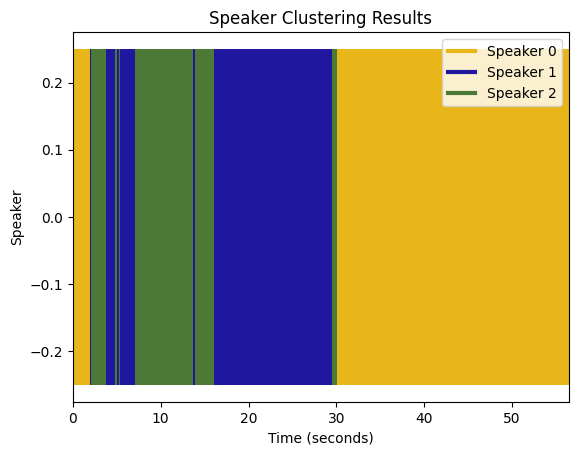

In [37]:
# Generate random colors for each speaker
colors = np.random.rand(len(set(df['Speaker'])), 3)

# Plot each speaker as a horizontal bar with a color corresponding to the speaker label
for i, row in df.iterrows():
    speaker = row['Speaker']
    start_time = row['Start Time']
    end_time = row['End Time']
    color = colors[int(speaker)]
    plt.barh(y=0, width=end_time-start_time, left=start_time, color=color, height=0.5)

# Set plot title and axis labels
plt.title('Speaker Clustering Results')
plt.xlabel('Time (seconds)')
plt.ylabel('Speaker')

# Generate legend
legend_elements = [plt.Line2D([0], [0], color=color, linewidth=3, label=f'Speaker {i}') for i, color in enumerate(colors)]
plt.legend(handles=legend_elements)

# Set x-axis limits to start and end times of audio file
plt.xlim((df['Start Time'].min(), df['End Time'].max()))

# Show the plot
plt.show()